In [2]:
import numpy as np
from sklearn.datasets import load_sample_image
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

from tensorflow.keras.layers import Conv2D

float64
(427, 640, 3)


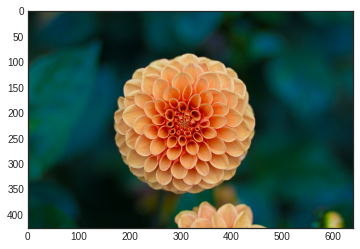

In [3]:
flower = load_sample_image('flower.jpg') / 255
print(flower.dtype)
print(flower.shape)
plt.imshow(flower)
plt.show()

float64
(427, 640, 3)


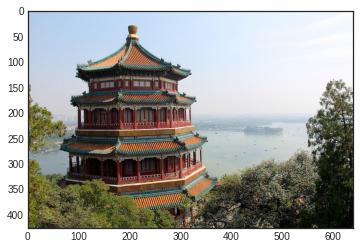

In [4]:
china = load_sample_image('china.jpg') / 255
print(china.dtype)
print(china.shape)
plt.imshow(china)
plt.show()

In [5]:
images = np.array([china, flower])
batch_size, height, width, channels = images.shape
print(images.shape)

(2, 427, 640, 3)


In [6]:
filters = np.zeros(shape=(7,7,channels,2), dtype=np.float32)
filters[:, 3, :, 0] = 1
filters[3, :, :, 1] = 1

print(filters.shape)

(7, 7, 3, 2)


In [7]:
conv = Conv2D(filters=16, kernel_size=3, activation='relu')

In [8]:
conv = Conv2D(filters=16, kernel_size=3, padding='same', strides=1, activation='relu')

## Max Pooling

In [9]:
from tensorflow.keras.layers import MaxPool2D

In [10]:
print(flower.shape)

flower = np.expand_dims(flower, axis=0)
print(flower.shape)

max_pool = MaxPool2D(pool_size=2)
output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = MaxPool2D(pool_size=2)(output)
print(output.shape)

(427, 640, 3)
(1, 427, 640, 3)
(1, 213, 320, 32)


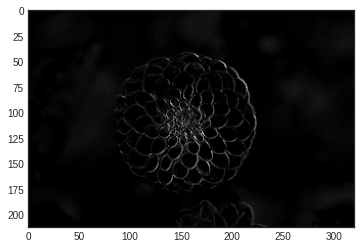

In [11]:
plt.imshow(output[0,:,:,4], cmap='gray')
plt.show()

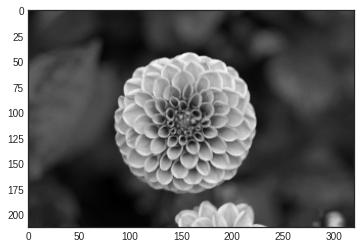

In [12]:
plt.imshow(output[0,:,:,8], cmap='gray')
plt.show()

## Avg Pooling

In [13]:
from tensorflow.keras.layers import AvgPool2D

In [14]:
print(flower.shape)

output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = AvgPool2D(pool_size=2)(output)
print(output.shape)

(1, 427, 640, 3)
(1, 213, 320, 32)


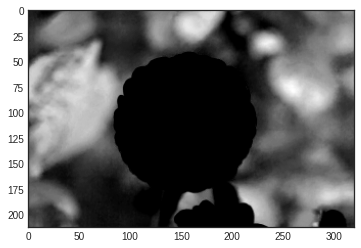

In [15]:
plt.imshow(output[0,:,:,2], cmap='gray')
plt.show()

## Global Avg Pooling

In [16]:
from tensorflow.keras.layers import GlobalAvgPool2D

In [17]:
print(flower.shape)

output = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu')(flower)
output = GlobalAvgPool2D()(output)
print(output.shape)

(1, 427, 640, 3)
(1, 32)


## Fully-Connected Layer

In [18]:
from tensorflow.keras.layers import Dense

In [19]:
output_size = 64

In [20]:
fc = Dense(units=output_size, activation='relu')

# MNIST (LeNet)

In [21]:
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from tensorflow.keras.datasets import mnist

import numpy as np

In [22]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train[..., np.newaxis], x_test[..., np.newaxis]

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

11490434/11490434 [==============================] - 0s 0us/step
(60000, 28, 28, 1)
(60000,)
(10000, 28, 28, 1)
(10000,)


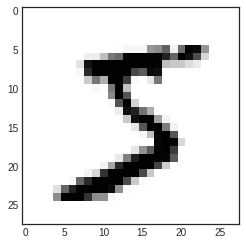

In [23]:
plt.imshow(x_train[0,:,:,0])

In [24]:
x_train, x_test = x_train / 255.0, x_test / 255.0

In [25]:
num_classes = 10
epochs = 30
batch_size = 32

In [26]:
class LeNet5(Model):
  def __init__(self, num_classes):
    super(LeNet5, self).__init__()
    self.conv1 = Conv2D(6, kernel_size=(5,5), padding='same', activation='relu')
    self.conv2 = Conv2D(16, kernel_size=(5,5), activation='relu')
    self.max_pool = MaxPool2D(pool_size=(2,2))
    self.flatten = Flatten()
    self.dense1 = Dense(120, activation='relu')
    self.dense2 = Dense(84, activation='relu')
    self.dense3 = Dense(num_classes, activation='softmax')
  
  def call(self, input_data):
    x = self.max_pool(self.conv1(input_data))
    x = self.max_pool(self.conv2(x))
    x = self.flatten(x)
    x = self.dense3(self.dense2(self.dense1(x)))
    
    return x

In [27]:
model = LeNet5(num_classes)

In [28]:
model.compile(optimizer='sgd',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [29]:
callbacks = [EarlyStopping(patience=3, monitor='val_loss'),
             TensorBoard(log_dir='./logs', histogram_freq=1)]

In [30]:
model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          validation_data=(x_test, y_test),
          callbacks=callbacks)

Epoch 1/30
1875/1875 [==============================] - 14s 6ms/step - loss: 0.6754 - accuracy: 0.7854 - val_loss: 0.1600 - val_accuracy: 0.9524
Epoch 2/30
1875/1875 [==============================] - 9s 5ms/step - loss: 0.1392 - accuracy: 0.9583 - val_loss: 0.1190 - val_accuracy: 0.9609
Epoch 3/30
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0948 - accuracy: 0.9707 - val_loss: 0.0798 - val_accuracy: 0.9732
Epoch 4/30
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0754 - accuracy: 0.9771 - val_loss: 0.0635 - val_accuracy: 0.9801
Epoch 5/30
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0635 - accuracy: 0.9797 - val_loss: 0.0590 - val_accuracy: 0.9795
Epoch 6/30
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0541 - accuracy: 0.9826 - val_loss: 0.0457 - val_accuracy: 0.9858
Epoch 7/30
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0483 - accuracy: 0.9855 - val_loss: 0.0484 - val_accur

In [31]:
%load_ext tensorboard

In [32]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Fashion MNIST

In [33]:
import datetime
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.datasets.fashion_mnist import load_data
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout, Input

In [34]:
(x_train, y_train), (x_test, y_test) = load_data()

x_train = x_train[..., np.newaxis]
x_test = x_test[..., np.newaxis]

x_train = x_train / 255.
x_test = x_test / 255.

print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

4422102/4422102 [==============================] - 0s 0us/step
(60000, 28, 28, 1)
(10000, 28, 28, 1)
(60000,)
(10000,)


In [35]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

In [36]:
def build_model():
  model = Sequential()

  input = Input(shape=(28,28,1))
  output = Conv2D(filters=32, kernel_size=(3,3))(input)
  output = Conv2D(filters=64, kernel_size=(3,3))(output)
  output = Conv2D(filters=64, kernel_size=(3,3))(output)
  output = Flatten()(output)
  output = Dense(128, activation='relu')(output)
  output = Dense(64, activation='relu')(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['acc'])
  
  return model

model_1 = build_model()
model_1.summary() 

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 conv2d_8 (Conv2D)           (None, 24, 24, 64)        18496     
                                                                 
 conv2d_9 (Conv2D)           (None, 22, 22, 64)        36928     
                                                                 
 flatten_1 (Flatten)         (None, 30976)             0         
                                                                 
 dense_4 (Dense)             (None, 128)               3965056   
                                                                 
 dense_5 (Dense)             (None, 64)                8256  

In [37]:
hist_1 = model_1.fit(x_train, y_train,
                     epochs=25,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/25
329/329 [==============================] - 8s 16ms/step - loss: 0.5403 - acc: 0.8089 - val_loss: 0.4199 - val_acc: 0.8464
Epoch 2/25
329/329 [==============================] - 6s 18ms/step - loss: 0.3573 - acc: 0.8686 - val_loss: 0.3682 - val_acc: 0.8668
Epoch 3/25
329/329 [==============================] - 5s 16ms/step - loss: 0.3001 - acc: 0.8904 - val_loss: 0.3833 - val_acc: 0.8612
Epoch 4/25
329/329 [==============================] - 5s 16ms/step - loss: 0.2593 - acc: 0.9041 - val_loss: 0.3774 - val_acc: 0.8712
Epoch 5/25
329/329 [==============================] - 5s 16ms/step - loss: 0.2177 - acc: 0.9191 - val_loss: 0.4135 - val_acc: 0.8651
Epoch 6/25
329/329 [==============================] - 5s 15ms/step - loss: 0.1928 - acc: 0.9279 - val_loss: 0.4350 - val_acc: 0.8677
Epoch 7/25
329/329 [==============================] - 5s 15ms/step - loss: 0.1650 - acc: 0.9380 - val_loss: 0.4474 - val_acc: 0.8726
Epoch 8/25
329/329 [==============================] - 5s 14ms/step - 

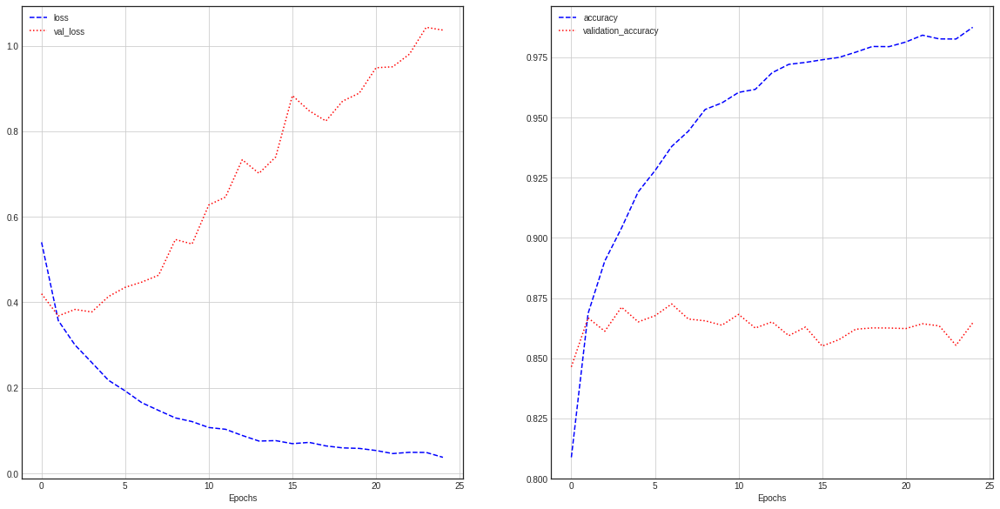

In [38]:
hist_1.history.keys()

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(hist_1.history['loss'], 'b--', label='loss')
plt.plot(hist_1.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(hist_1.history['acc'], 'b--', label='accuracy')
plt.plot(hist_1.history['val_acc'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [39]:
model_1.evaluate(x_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 1.0866 - acc: 0.8596


[1.0866225957870483, 0.8596000075340271]

In [40]:
# Overfitting 방지

def build_model2():
  model = Sequential()

  input = Input(shape=(28,28,1))
  output = Conv2D(filters=32, kernel_size=(3,3))(input)
  output = MaxPool2D(strides=(2,2))(output)
  output = Conv2D(filters=64, kernel_size=(3,3))(output)
  output = Dropout(0.4)(output)
  output = MaxPool2D(strides=(2,2))(output)
  output = Conv2D(filters=64, kernel_size=(3,3))(output)
  output = Dropout(0.4)(output)
  output = MaxPool2D(strides=(2,2))(output)
  output = Flatten()(output)
  output = Dense(128, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(64, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['acc'])
  
  return model

model_2 = build_model2()
model_2.summary() 

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_10 (Conv2D)          (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 11, 11, 64)        18496     
                                                                 
 dropout (Dropout)           (None, 11, 11, 64)        0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                       

In [41]:
hist_2 = model_2.fit(x_train, y_train,
                     epochs=40,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/40
329/329 [==============================] - 7s 13ms/step - loss: 1.1565 - acc: 0.5705 - val_loss: 0.7098 - val_acc: 0.7493
Epoch 2/40
329/329 [==============================] - 3s 9ms/step - loss: 0.7344 - acc: 0.7345 - val_loss: 0.6075 - val_acc: 0.7799
Epoch 3/40
329/329 [==============================] - 4s 11ms/step - loss: 0.6506 - acc: 0.7687 - val_loss: 0.5776 - val_acc: 0.7815
Epoch 4/40
329/329 [==============================] - 4s 12ms/step - loss: 0.6036 - acc: 0.7866 - val_loss: 0.5240 - val_acc: 0.8054
Epoch 5/40
329/329 [==============================] - 4s 11ms/step - loss: 0.5707 - acc: 0.8027 - val_loss: 0.5101 - val_acc: 0.8162
Epoch 6/40
329/329 [==============================] - 3s 8ms/step - loss: 0.5410 - acc: 0.8116 - val_loss: 0.4852 - val_acc: 0.8235
Epoch 7/40
329/329 [==============================] - 2s 7ms/step - loss: 0.5225 - acc: 0.8214 - val_loss: 0.4599 - val_acc: 0.8292
Epoch 8/40
329/329 [==============================] - 2s 7ms/step - loss

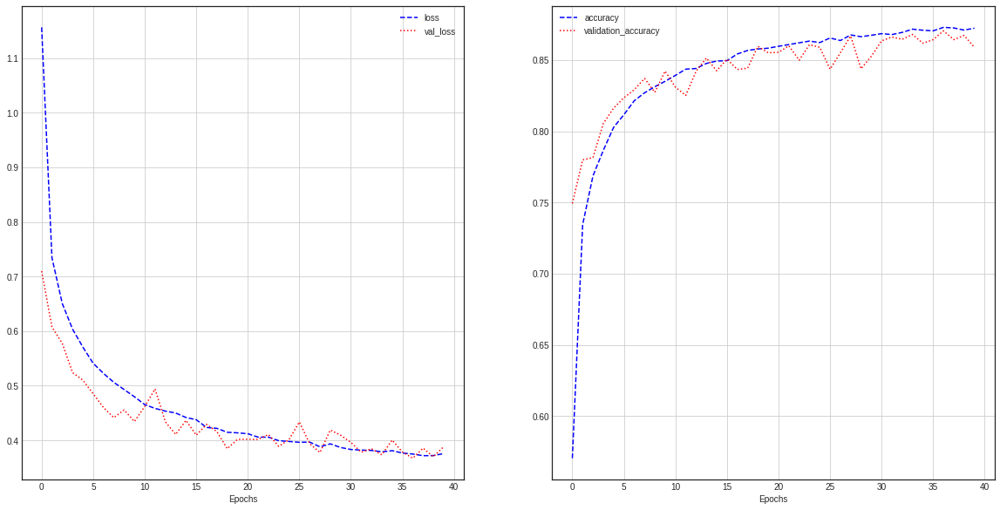

In [42]:
hist_2.history.keys()

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(hist_2.history['loss'], 'b--', label='loss')
plt.plot(hist_2.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(hist_2.history['acc'], 'b--', label='accuracy')
plt.plot(hist_2.history['val_acc'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [43]:
model_2.evaluate(x_test, y_test)

313/313 [==============================] - 1s 4ms/step - loss: 0.4057 - acc: 0.8552


[0.40570947527885437, 0.8551999926567078]

In [44]:
from tensorflow.keras.layers import BatchNormalization

In [45]:
# performance를 높이고자 layer add

def build_model3():
  model = Sequential()

  input = Input(shape=(28,28,1))
  output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same')(input)
  output = BatchNormalization()(output)
  output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='valid')(output)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2,2))(output)

  output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same')(output)
  output = BatchNormalization()(output)
  output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='valid')(output)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2,2))(output)
  
  output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='same')(output)
  output = BatchNormalization()(output)
  output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='valid')(output)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2,2))(output)

  output = Flatten()(output)
  output = Dense(512, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(256, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['acc'])
  
  return model

model_3 = build_model3()
model_3.summary() 

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_13 (Conv2D)          (None, 28, 28, 64)        640       
                                                                 
 batch_normalization (BatchN  (None, 28, 28, 64)       256       
 ormalization)                                                   
                                                                 
 conv2d_14 (Conv2D)          (None, 26, 26, 64)        36928     
                                                                 
 dropout_4 (Dropout)         (None, 26, 26, 64)        0         
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 13, 13, 64)       0         
 2D)                                                       

In [46]:
hist_3 = model_3.fit(x_train, y_train,
                     epochs=25,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/25
329/329 [==============================] - 18s 37ms/step - loss: 0.7915 - acc: 0.7120 - val_loss: 2.3556 - val_acc: 0.1593
Epoch 2/25
329/329 [==============================] - 12s 35ms/step - loss: 0.4628 - acc: 0.8368 - val_loss: 1.2504 - val_acc: 0.7220
Epoch 3/25
329/329 [==============================] - 12s 36ms/step - loss: 0.3783 - acc: 0.8682 - val_loss: 0.7187 - val_acc: 0.8106
Epoch 4/25
329/329 [==============================] - 12s 36ms/step - loss: 0.3396 - acc: 0.8813 - val_loss: 0.6736 - val_acc: 0.8065
Epoch 5/25
329/329 [==============================] - 12s 36ms/step - loss: 0.3082 - acc: 0.8920 - val_loss: 0.5866 - val_acc: 0.8723
Epoch 6/25
329/329 [==============================] - 11s 34ms/step - loss: 0.2917 - acc: 0.8979 - val_loss: 0.5186 - val_acc: 0.8682
Epoch 7/25
329/329 [==============================] - 12s 36ms/step - loss: 0.2806 - acc: 0.9020 - val_loss: 0.6063 - val_acc: 0.8577
Epoch 8/25
329/329 [==============================] - 10s 32ms

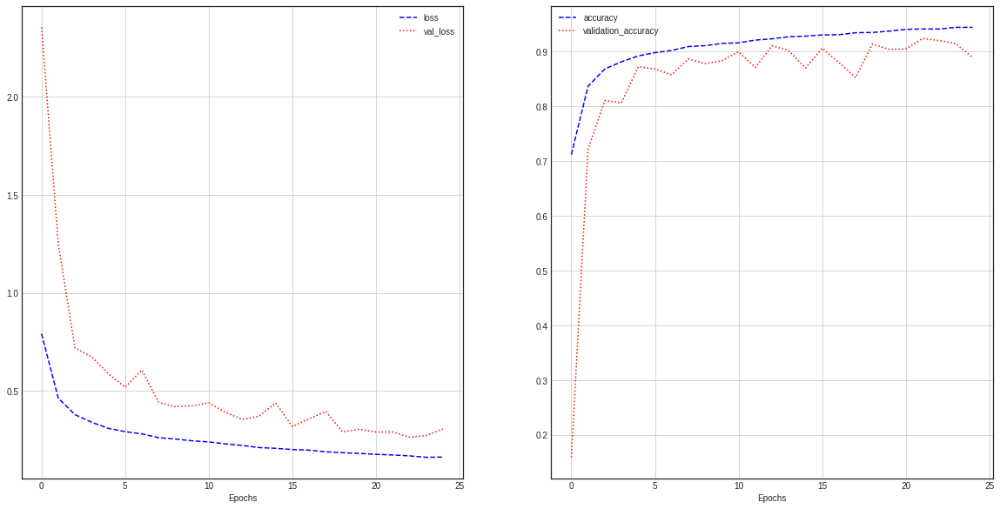

In [47]:
hist_3.history.keys()

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(hist_3.history['loss'], 'b--', label='loss')
plt.plot(hist_3.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(hist_3.history['acc'], 'b--', label='accuracy')
plt.plot(hist_3.history['val_acc'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [48]:
model_3.evaluate(x_test, y_test)

313/313 [==============================] - 2s 5ms/step - loss: 0.3142 - acc: 0.8848


[0.3142079710960388, 0.8848000168800354]

In [49]:
# performance를 더 높이고자 image augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [50]:
image_generator = ImageDataGenerator(
    rotation_range = 10,
    zoom_range = 0.2,
    shear_range = 0.6,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    horizontal_flip=True,
    vertical_flip = False
)

augment_size = 200

print(x_train.shape)
print(x_train[0].shape)

(60000, 28, 28, 1)
(28, 28, 1)


In [51]:
x_augment = image_generator.flow(np.tile(x_train[0].reshape(28*28*1), augment_size).reshape(-1,28,28,1),
                                 np.zeros(augment_size), batch_size= augment_size, shuffle=False).next()[0] 

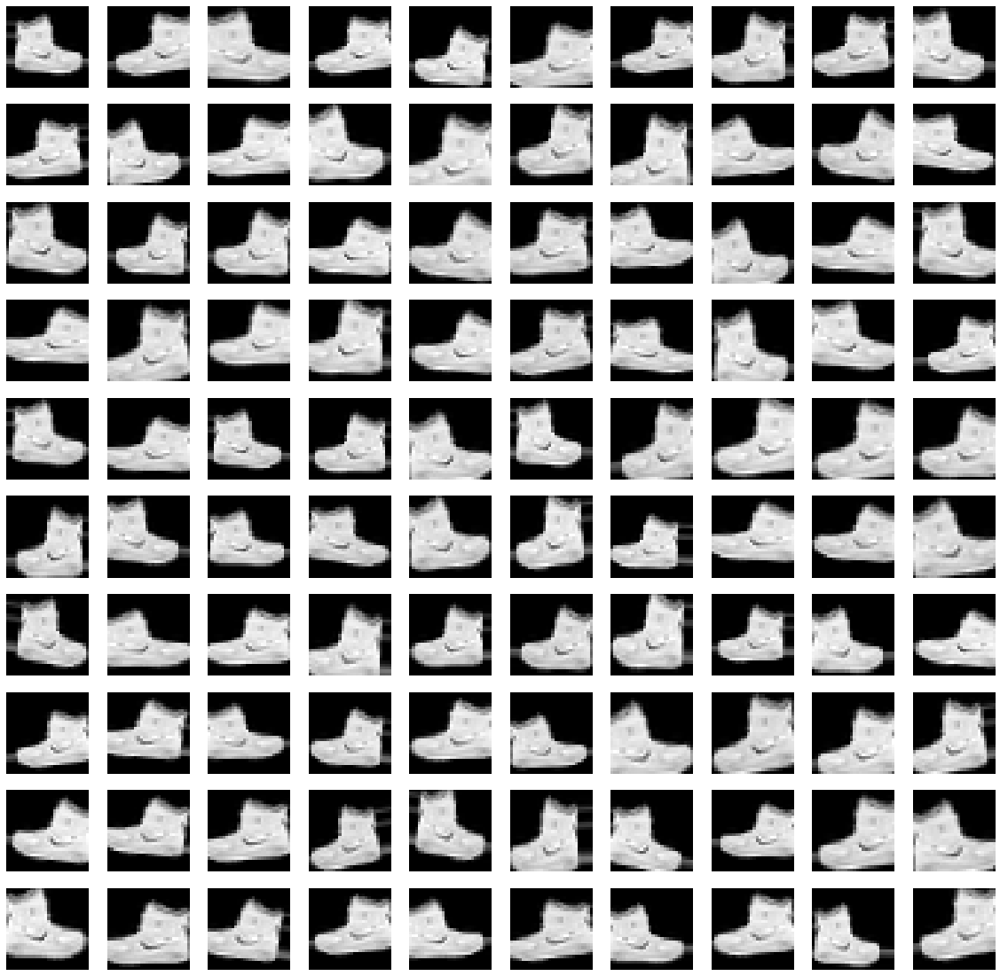

In [52]:
plt.figure(figsize=(20,20))
for i in range(1,101):
  plt.subplot(10,10,i)
  plt.axis('off')
  plt.imshow(x_augment[i-1].reshape(28,28), cmap='gray')

In [53]:
image_generator = ImageDataGenerator(
    rotation_range = 15,
    zoom_range = 0.1,
    shear_range = 0.6,
    width_shift_range = 0.15,
    height_shift_range = 0.1,
    horizontal_flip=True,
    vertical_flip = False
)

augment_size = 30000

random_mask = np.random.randint(x_train.shape[0], size=augment_size)
x_augmented = x_train[random_mask].copy()
y_augmented = y_train[random_mask].copy()

In [54]:
 x_augmented = image_generator.flow(x_augmented, np.zeros(augment_size), 
                                    batch_size= augment_size, shuffle=False).next()[0]

x_train = np.concatenate((x_train, x_augmented))
y_train = np.concatenate((y_train, y_augmented))

print(x_train.shape)
print(y_train.shape)

(90000, 28, 28, 1)
(90000,)


In [55]:
model_4 = build_model3()
model_4.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_19 (Conv2D)          (None, 28, 28, 64)        640       
                                                                 
 batch_normalization_3 (Batc  (None, 28, 28, 64)       256       
 hNormalization)                                                 
                                                                 
 conv2d_20 (Conv2D)          (None, 26, 26, 64)        36928     
                                                                 
 dropout_9 (Dropout)         (None, 26, 26, 64)        0         
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 13, 13, 64)       0         
 2D)                                                       

In [56]:
hist_4 = model_4.fit(x_train, y_train,
                     epochs=40,
                     validation_split=0.3,
                     batch_size=128)

Epoch 1/40
493/493 [==============================] - 21s 34ms/step - loss: 0.7198 - acc: 0.7388 - val_loss: 2.5314 - val_acc: 0.1175
Epoch 2/40
493/493 [==============================] - 19s 39ms/step - loss: 0.4212 - acc: 0.8530 - val_loss: 1.3425 - val_acc: 0.5468
Epoch 3/40
493/493 [==============================] - 17s 34ms/step - loss: 0.3575 - acc: 0.8742 - val_loss: 1.2458 - val_acc: 0.6110
Epoch 4/40
493/493 [==============================] - 16s 33ms/step - loss: 0.3239 - acc: 0.8878 - val_loss: 1.0169 - val_acc: 0.6850
Epoch 5/40
493/493 [==============================] - 16s 33ms/step - loss: 0.3013 - acc: 0.8951 - val_loss: 1.1675 - val_acc: 0.6675
Epoch 6/40
493/493 [==============================] - 16s 33ms/step - loss: 0.2875 - acc: 0.8999 - val_loss: 1.2539 - val_acc: 0.5843
Epoch 7/40
493/493 [==============================] - 15s 30ms/step - loss: 0.2672 - acc: 0.9067 - val_loss: 0.9250 - val_acc: 0.7462
Epoch 8/40
493/493 [==============================] - 16s 33ms

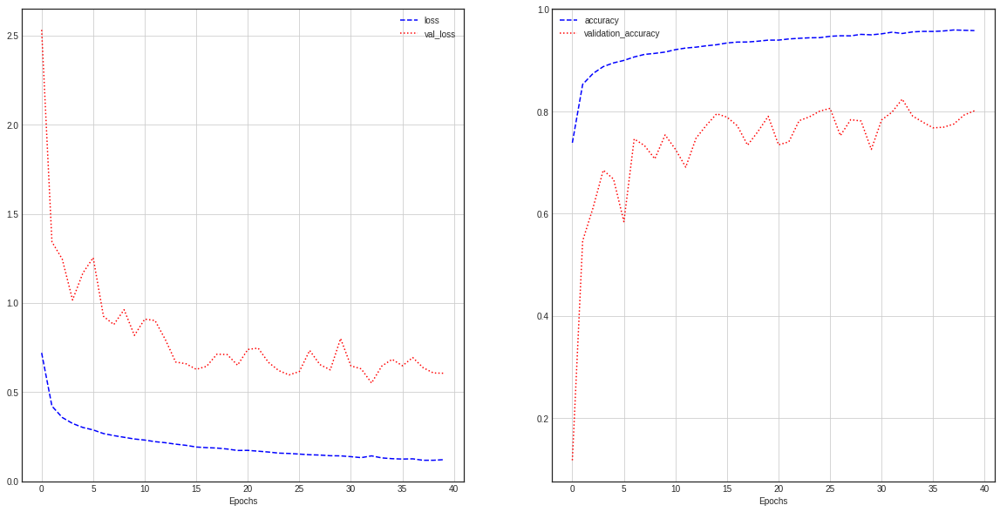

In [57]:
hist_4.history.keys()

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(hist_4.history['loss'], 'b--', label='loss')
plt.plot(hist_4.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(hist_4.history['acc'], 'b--', label='accuracy')
plt.plot(hist_4.history['val_acc'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [58]:
model_4.evaluate(x_test, y_test)

313/313 [==============================] - 2s 5ms/step - loss: 0.2484 - acc: 0.9188


[0.24838745594024658, 0.9187999963760376]

# CIFAR-10

In [79]:
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Input, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

import numpy as np

In [80]:
(x_train_full, y_train_full), (x_test, y_test) = cifar10.load_data()
print(x_train_full.shape, y_train_full.shape)
print(x_test.shape, y_test.shape)

(50000, 32, 32, 3) (50000, 1)
(10000, 32, 32, 3) (10000, 1)


In [81]:
print(y_test[5])

[6]


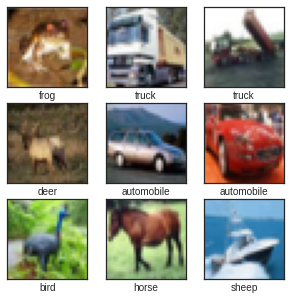

In [82]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'sheep', 'truck']

random_idx = np.random.randint(50000, size=9)

plt.figure(figsize=(5,5))
for i, idx in enumerate(random_idx):
  plt.subplot(3,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(x_train_full[i])
  plt.xlabel(class_names[int(y_train_full[i])])

In [83]:
x_mean = np.mean(x_train_full, axis=(0,1,2))
x_std = np.std(x_train_full, axis=(0,1,2))

x_train_full = (x_train_full - x_mean) / x_std
x_test = (x_test - x_mean) / x_std

x_train, x_val, y_train, y_val = train_test_split(x_train_full, y_train_full, test_size=0.2)

print(x_train.shape)
print(y_train.shape)

print(x_val.shape)
print(y_val.shape)

print(x_test.shape)
print(y_test.shape)

(40000, 32, 32, 3)
(40000, 1)
(10000, 32, 32, 3)
(10000, 1)
(10000, 32, 32, 3)
(10000, 1)


In [88]:
def model_build():
  model = Sequential()

  input = Input(shape=(32,32,3))

  output = Conv2D(filters=32, kernel_size=3, padding='same', activation='relu')(input)
  output = MaxPool2D(pool_size=(2,2), strides=2, padding='same')(output)

  output = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(output)
  output = MaxPool2D(pool_size=(2,2), strides=2, padding='same')(output)

  output = Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')(output)
  output = MaxPool2D(pool_size=(2,2), strides=2, padding='same')(output)

  output = Flatten()(output)
  output = Dense(256, activation='relu')(output)
  output = Dense(128, activation='relu')(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer=Adam(learning_rate=1e-4),
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])
  return model

In [89]:
model = model_build()
model.summary()

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_46 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_47 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 8, 8, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_48 (Conv2D)          (None, 8, 8, 128)         738

In [90]:
history = model.fit(x_train, y_train,
                    epochs=30,
                    batch_size=256,
                    validation_data=(x_val, y_val))

Epoch 1/30
157/157 [==============================] - 5s 18ms/step - loss: 1.8543 - accuracy: 0.3371 - val_loss: 1.5823 - val_accuracy: 0.4335
Epoch 2/30
157/157 [==============================] - 2s 12ms/step - loss: 1.4944 - accuracy: 0.4678 - val_loss: 1.4274 - val_accuracy: 0.4886
Epoch 3/30
157/157 [==============================] - 2s 12ms/step - loss: 1.3641 - accuracy: 0.5164 - val_loss: 1.3209 - val_accuracy: 0.5279
Epoch 4/30
157/157 [==============================] - 2s 12ms/step - loss: 1.2880 - accuracy: 0.5472 - val_loss: 1.2673 - val_accuracy: 0.5488
Epoch 5/30
157/157 [==============================] - 2s 12ms/step - loss: 1.2281 - accuracy: 0.5668 - val_loss: 1.2319 - val_accuracy: 0.5586
Epoch 6/30
157/157 [==============================] - 2s 13ms/step - loss: 1.1740 - accuracy: 0.5874 - val_loss: 1.1816 - val_accuracy: 0.5788
Epoch 7/30
157/157 [==============================] - 2s 14ms/step - loss: 1.1256 - accuracy: 0.6078 - val_loss: 1.1404 - val_accuracy: 0.5984

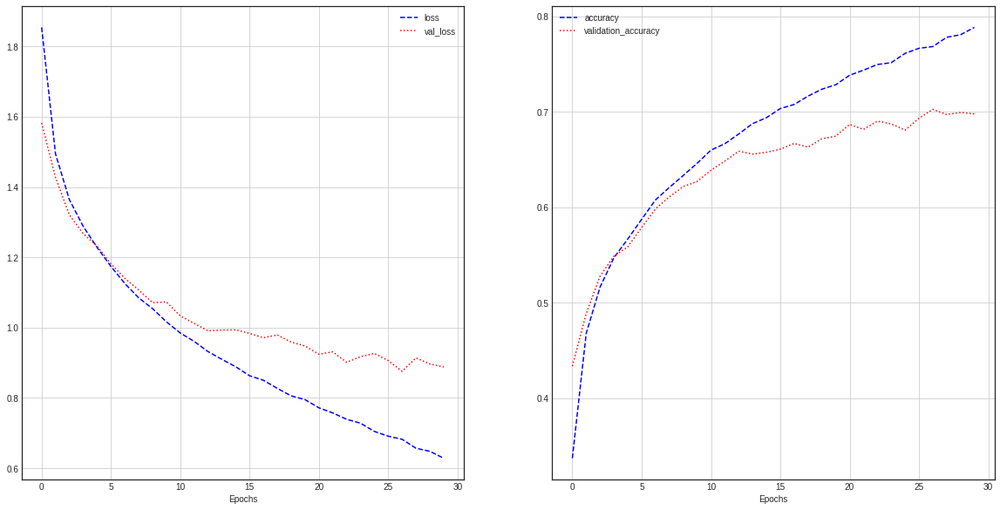

In [91]:
history.history.keys()

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(history.history['loss'], 'b--', label='loss')
plt.plot(history.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], 'b--', label='accuracy')
plt.plot(history.history['val_accuracy'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

In [95]:
# overfitting 약간 발생
# 해결하고자 Dropout

def build_model2():
  model = Sequential()

  input = Input(shape=(32,32,3))
  output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same')(input)
  output = BatchNormalization()(output)
  output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='valid')(output)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2,2))(output)

  output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same')(output)
  output = BatchNormalization()(output)
  output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='valid')(output)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2,2))(output)
  
  output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='same')(output)
  output = BatchNormalization()(output)
  output = Conv2D(filters=256, kernel_size=3, activation='relu', padding='valid')(output)
  output = Dropout(0.5)(output)
  output = MaxPool2D(strides=(2,2))(output)

  output = Flatten()(output)
  output = Dense(512, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(256, activation='relu')(output)
  output = Dropout(0.5)(output)
  output = Dense(10, activation='softmax')(output)

  model = Model(inputs=[input], outputs=output)

  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])
  
  return model

In [96]:
model = build_model2()
model.summary()

Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_55 (Conv2D)          (None, 32, 32, 64)        1792      
                                                                 
 batch_normalization_9 (Batc  (None, 32, 32, 64)       256       
 hNormalization)                                                 
                                                                 
 conv2d_56 (Conv2D)          (None, 30, 30, 64)        36928     
                                                                 
 dropout_19 (Dropout)        (None, 30, 30, 64)        0         
                                                                 
 max_pooling2d_39 (MaxPoolin  (None, 15, 15, 64)       0         
 g2D)                                                     

In [97]:
history = model.fit(x_train, y_train,
                    epochs=100,
                    batch_size=512,
                    validation_data=(x_val, y_val))

Epoch 1/100
79/79 [==============================] - 17s 143ms/step - loss: 2.1054 - accuracy: 0.2576 - val_loss: 2.3303 - val_accuracy: 0.1013
Epoch 2/100
79/79 [==============================] - 10s 122ms/step - loss: 1.6081 - accuracy: 0.4146 - val_loss: 2.4223 - val_accuracy: 0.1076
Epoch 3/100
79/79 [==============================] - 10s 124ms/step - loss: 1.3804 - accuracy: 0.5030 - val_loss: 2.2323 - val_accuracy: 0.1883
Epoch 4/100
79/79 [==============================] - 10s 125ms/step - loss: 1.2045 - accuracy: 0.5764 - val_loss: 2.3616 - val_accuracy: 0.2067
Epoch 5/100
79/79 [==============================] - 10s 124ms/step - loss: 1.0793 - accuracy: 0.6241 - val_loss: 2.0969 - val_accuracy: 0.3298
Epoch 6/100
79/79 [==============================] - 10s 124ms/step - loss: 0.9887 - accuracy: 0.6567 - val_loss: 2.0486 - val_accuracy: 0.3132
Epoch 7/100
79/79 [==============================] - 10s 127ms/step - loss: 0.8922 - accuracy: 0.6935 - val_loss: 1.9520 - val_accuracy:

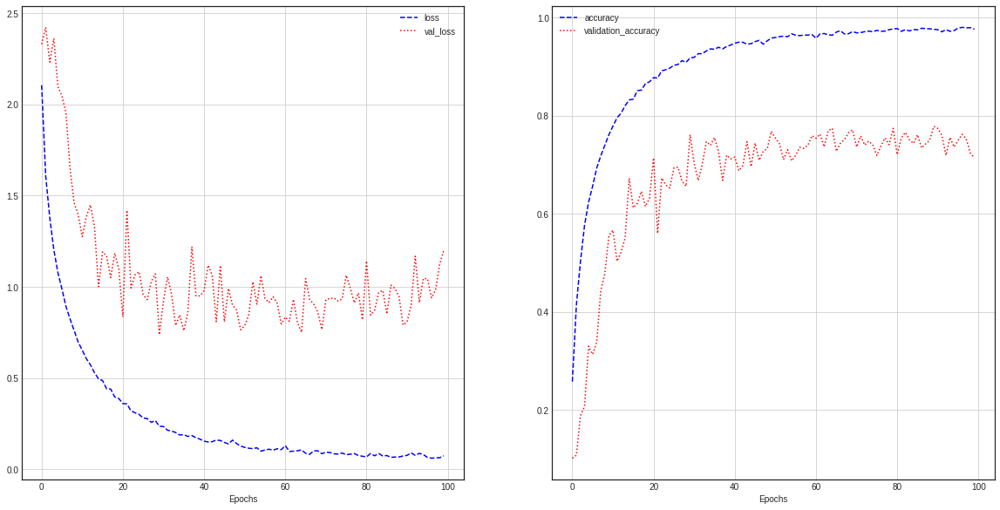

In [98]:
history.history.keys()

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(history.history['loss'], 'b--', label='loss')
plt.plot(history.history['val_loss'], 'r:', label='val_loss')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], 'b--', label='accuracy')
plt.plot(history.history['val_accuracy'], 'r:', label='validation_accuracy')
plt.xlabel('Epochs')
plt.grid()
plt.legend()

plt.show()

## VGGNet (Visual Geometry Group Net)

- 활성화 함수로 Relu, Dropout 적용
- 합성곱과 풀링 계층으로 구성된 block과 분류를 위한 완전 연결계층으로 결합된 전형적인 구조
- 이미지 변환, 좌우 반전 등의 변환을 시도하여 인위적으로 데이터셋을 늘림
- 몇 개의 합성곱 계층과 최대-풀링 계층이 따르는 5개의 block과 3개의 완전 연결계층(학습 시, Dropout 사용)으로 구성
- 모든 합성곱과 최대-풀링 계층에 padding='same' 적용
- 합성곱 계층에는 stride=1, activation='relu'
- feature map depth를 증가시킴
- 척도 변경을 통한 Data augmentation
- ImageNet에서 훈련이 끝난 후 얻게된 매개변수 값 로딩
- 네트워크를 다시 처음부터 학습하고자 한다면 weights=None으로 설정, keras에서는 무작위로 가중치를 설정
- include_top=False: VGG의 밀집 계층을 제외한다는 뜻
- 해당 네트워크의 출력은 합성곱/최대-풀링 block의 feature map이 됨
- pooling: feature map을 반환하기 전에 적용할 선택적인 연산을 지정

In [102]:
from tensorflow.keras.preprocessing import image
from keras.applications.vgg19 import VGG19, preprocess_input, decode_predictions

vggnet = VGG19(include_top=True, weights='imagenet',
               input_tensor=None, input_shape=None,
               pooling=None, classes=1000)
vggnet.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [100]:
!wget -O dog.jpg https://www.publicdomainpictures.net/pictures/250000/nahled/dog-beagle-portrait.jpg

--2023-02-28 13:08:33--  https://www.publicdomainpictures.net/pictures/250000/nahled/dog-beagle-portrait.jpg
Resolving www.publicdomainpictures.net (www.publicdomainpictures.net)... 172.67.2.204, 104.20.44.162, 104.20.45.162, ...
Connecting to www.publicdomainpictures.net (www.publicdomainpictures.net)|172.67.2.204|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 94395 (92K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>]  92.18K  --.-KB/s    in 0.007s  

2023-02-28 13:08:34 (12.1 MB/s) - ‘dog.jpg’ saved [94395/94395]



35363/35363 [==============================] - 0s 0us/step
[[('n02088364', 'beagle', 0.83938146), ('n02089973', 'English_foxhound', 0.08834782), ('n02089867', 'Walker_hound', 0.06238833), ('n02088238', 'basset', 0.004565096), ('n02088632', 'bluetick', 0.0033394652)]]


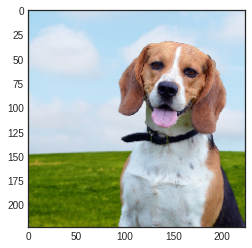

In [105]:
img = image.load_img('dog.jpg', target_size=(224,224))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = vggnet.predict(x)
print(decode_predictions(preds))

## GoogLeNet, Inception

- VGGNet을 제치고 같은 해 분류 과제에서 1등을 차지
- 인셉션 블록이라는 개념을 도입하여 Inception Network라고도 불림
- CNN 계산 용량을 최적화하는 것을 고려
- 전형적인 합성곱, 풀링 계층으로 시작하고, 이 정보는 9개의 인셉션 모듈 스택을 통과 (해당 모듈을 하위 네트워크라고도 함)
- 각 모듈에서 input feature map은 서로 다른 계층으로 구성된 4개의 병렬 하위 block에 전달되고, 이를 서로 다시 연결
- 모든 합성곱과 풀링 계층은 padding='same', stride=1, activation='relu'
- 규모가 큰 블록과 병목을 보편화
- 병목 계층으로 1X1 합성곱 계층 사용
- 완전 연결 계층 대신 풀링 계층 사용
- 중간 소실로 경사 소실 문제 해결

In [107]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions

inception = InceptionV3(include_top=True, weights='imagenet',
                        input_tensor=None, input_shape=None,
                        pooling=None, classes=1000)
inception.summary()

96112376/96112376 [==============================] - 1s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_61 (Conv2D)             (None, 149, 149, 32  864         ['input_17[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_12 (BatchN  (None, 149, 149, 32  96         ['conv2d_61[0][0]']              
 ormalization)        

In [108]:
!wget -O fish.jpg https://upload.wikimedia.org/wikipedia/commons/7/7a/Goldfish_1.jpg

--2023-02-28 13:21:47--  https://upload.wikimedia.org/wikipedia/commons/7/7a/Goldfish_1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4648040 (4.4M) [image/jpeg]
Saving to: ‘fish.jpg’

fish.jpg            100%[===================>]   4.43M  13.0MB/s    in 0.3s    

2023-02-28 13:21:48 (13.0 MB/s) - ‘fish.jpg’ saved [4648040/4648040]



1/1 [==============================] - 2s 2s/step
[[('n01443537', 'goldfish', 0.9748303), ('n02701002', 'ambulance', 0.0023265774), ('n02606052', 'rock_beauty', 0.0019084722), ('n02607072', 'anemone_fish', 0.0006640246), ('n09256479', 'coral_reef', 0.0004321765)]]


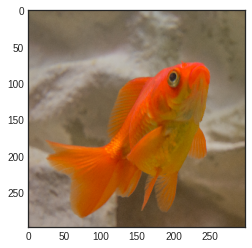

In [110]:
from keras.applications.inception_resnet_v2 import inception_resnet_block
img = image.load_img('fish.jpg', target_size=(299,299))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = inception.predict(x)
print(decode_predictions(preds))

# ResNet (Residual Net)

- 네트워크의 깊이가 깊어질수록 경사가 소실되거나 폭발하는 문제를 해결하고자 함
- 병목 합성곱 계층을 추가하거나 크기가 작은 kernel을 사용
- 152개의 훈련가능한 계층을 수직으로 연결하여 구성
- 모든 합성곱과 풀링 계층에서 padding='same', stride=1 사용
- 3X3 합성곱 계층 다음마다 Batch Normalization 적용, 1X1 합성곱 계층에서는 activation function이 존재하지 않음

In [111]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

resnet = ResNet50(include_top=True, weights='imagenet',
                  input_tensor=None, input_shape=None,
                  pooling=None, classes=1000)
resnet.summary()

102967424/102967424 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_18[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                        

In [112]:
!wget -O bee.jpg https://upload.wikimedia.org/wikipedia/commons/4/4d/Apis_mellifera_Western_honey_bee.jpg

--2023-02-28 13:35:02--  https://upload.wikimedia.org/wikipedia/commons/4/4d/Apis_mellifera_Western_honey_bee.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2421052 (2.3M) [image/jpeg]
Saving to: ‘bee.jpg’

bee.jpg             100%[===================>]   2.31M  15.4MB/s    in 0.2s    

2023-02-28 13:35:03 (15.4 MB/s) - ‘bee.jpg’ saved [2421052/2421052]



1/1 [==============================] - 1s 1s/step
[[('n02206856', 'bee', 0.9990995), ('n03530642', 'honeycomb', 0.0005614693), ('n02190166', 'fly', 0.00014320078), ('n02727426', 'apiary', 0.00010164116), ('n02219486', 'ant', 5.7396053e-05)]]


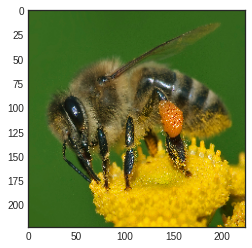

In [113]:
img = image.load_img('bee.jpg', target_size=(224,224))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = resnet.predict(x)
print(decode_predictions(preds))

# Xception

- Inception module을 이용하여 depthwise convolution 적용

In [114]:
from tensorflow.keras.applications.xception import Xception, preprocess_input, decode_predictions

xception = Xception(include_top=True, weights='imagenet',
                    input_tensor=None, input_shape=None,
                    pooling=None, classes=1000)
xception.summary()

91884032/91884032 [==============================] - 1s 0us/step
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_19 (InputLayer)          [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 149, 149, 32  864         ['input_19[0][0]']               
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 149, 149, 32  128        ['block1_conv1[0][0]']           
 ation)                   

In [115]:
!wget -O beaver.jpg https://upload.wikimedia.org/wikipedia/commons/6/6b/American_Beaver.jpg

--2023-02-28 13:39:02--  https://upload.wikimedia.org/wikipedia/commons/6/6b/American_Beaver.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 186747 (182K) [image/jpeg]
Saving to: ‘beaver.jpg’

beaver.jpg          100%[===================>] 182.37K  --.-KB/s    in 0.06s   

2023-02-28 13:39:02 (3.08 MB/s) - ‘beaver.jpg’ saved [186747/186747]



1/1 [==============================] - 2s 2s/step
[[('n02363005', 'beaver', 0.82783955), ('n02361337', 'marmot', 0.059819814), ('n02493509', 'titi', 0.0044267927), ('n02442845', 'mink', 0.0024072048), ('n01883070', 'wombat', 0.0019868782)]]


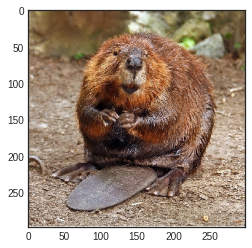

In [118]:
img = image.load_img('beaver.jpg', target_size=(299,299))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = xception.predict(x)
print(decode_predictions(preds))

# MobileNet

- 성능보다 모델의 크기 또는 연산 속도 감소
- Depthwise conv와 Pointwise conv 사이에도 Batch Normalization과 Relu를 삽입
- Conv layer를 활용한 모델과 정확도는 비슷하면서 계산량은 9배, 파라미터 수는 7배 줄임

In [120]:
from tensorflow.keras.applications.mobilenet import MobileNet, preprocess_input, decode_predictions

mobilenet = MobileNet(include_top=True, weights='imagenet',
                      input_tensor=None, input_shape=None,
                      pooling=None, classes=1000)
mobilenet.summary()

17225924/17225924 [==============================] - 0s 0us/step
Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32

In [121]:
!wget -O crane.jpg https://p1.pxfuel.com/preview/42/50/534/europe-channel-crane-harbour-crane-harbour-cranes-cranes-transport.jpg

--2023-02-28 13:43:00--  https://p1.pxfuel.com/preview/42/50/534/europe-channel-crane-harbour-crane-harbour-cranes-cranes-transport.jpg
Resolving p1.pxfuel.com (p1.pxfuel.com)... 172.67.169.122, 104.21.71.48, 2606:4700:3035::6815:4730, ...
Connecting to p1.pxfuel.com (p1.pxfuel.com)|172.67.169.122|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 86911 (85K) [image/jpeg]
Saving to: ‘crane.jpg’

crane.jpg           100%[===================>]  84.87K  --.-KB/s    in 0.02s   

2023-02-28 13:43:01 (3.73 MB/s) - ‘crane.jpg’ saved [86911/86911]



1/1 [==============================] - 2s 2s/step
[[('n03126707', 'crane', 0.96001226), ('n03216828', 'dock', 0.02943855), ('n03240683', 'drilling_platform', 0.005129008), ('n03344393', 'fireboat', 0.0026267357), ('n04366367', 'suspension_bridge', 0.00050067244)]]


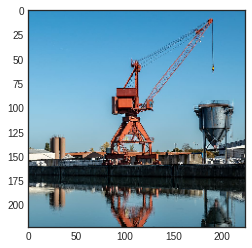

In [122]:
img = image.load_img('crane.jpg', target_size=(224,224))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = mobilenet.predict(x)
print(decode_predictions(preds))

# DenseNet

- 각 층은 모든 앞 단계에서 올 수 있는 지름길 연결 구성
- 특징지도의 크기를 줄이기 위해 풀링 연산 적용 필요
- 밀집 블록(dense block)과 전이층(transition layer)으로 구성
- 전이층: 1X1 convolution과 평균값 풀링(APool)으로 구성

In [124]:
from tensorflow.keras.applications.densenet import DenseNet201, preprocess_input, decode_predictions

densenet = DenseNet201(include_top=True, weights='imagenet',
                       input_tensor=None, input_shape=None,
                       pooling=None, classes=1000)
densenet.summary()

82524592/82524592 [==============================] - 1s 0us/step
Model: "densenet201"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_21[0][0]']               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                       

In [125]:
!wget -O zebra.jpg https://upload.wikimedia.org/wikipedia/commons/f/f0/Zebra_standing_alone_crop.jpg

--2023-02-28 13:47:43--  https://upload.wikimedia.org/wikipedia/commons/f/f0/Zebra_standing_alone_crop.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 188036 (184K) [image/jpeg]
Saving to: ‘zebra.jpg’

zebra.jpg           100%[===================>] 183.63K  --.-KB/s    in 0.06s   

2023-02-28 13:47:43 (3.21 MB/s) - ‘zebra.jpg’ saved [188036/188036]



1/1 [==============================] - 5s 5s/step
[[('n02391049', 'zebra', 0.93139106), ('n01518878', 'ostrich', 0.01975293), ('n02423022', 'gazelle', 0.011579052), ('n02397096', 'warthog', 0.004624995), ('n02422106', 'hartebeest', 0.0031486712)]]


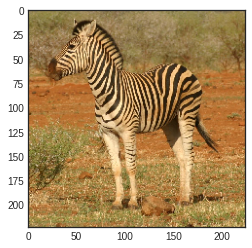

In [126]:
img = image.load_img('zebra.jpg', target_size=(224,224))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = densenet.predict(x)
print(decode_predictions(preds))

# NasNet

- 신경망 구조를 사람이 설계하지 않고, complete search를 통해 자동으로 구조를 찾아냄
- 네트워크를 구성하는 layer를 하나씩 탐색하는 NAS 방법 대신, NasNet은 Convolution cell 단위를 먼저 추정하고, 이들을 조합하여 전체 네트워크 구성
- 성능은 높지만, 파라미터 수와 연산량은 절반 정도로 감소 

In [ ]:
from tensorflow.keras.applications.nasnet import NASNetLarge, preprocess_input, decode_predictions

nasnet = NASNetLarge(include_top=True, weights='imagenet',
                      input_tensor=None, input_shape=None,
                      pooling=None, classes=1000)
nasnet.summary()

359748576/359748576 [==============================] - 2s 0us/step
Model: "NASNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 331, 331, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 165, 165, 96  2592        ['input_22[0][0]']               
                                )                                                                 
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 165, 165, 96  384         ['stem_conv1[0][0]']             
                          

In [132]:
!wget -O notebook.jpg https://cdn.pixabay.com/photo/2016/07/11/03/35/macbook-1508998_1280.jpg

--2023-02-28 13:52:51--  https://cdn.pixabay.com/photo/2016/07/11/03/35/macbook-1508998_1280.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.15.16, 104.18.14.16, 2606:4700::6812:f10, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.15.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 270631 (264K) [binary/octet-stream]
Saving to: ‘notebook.jpg’

notebook.jpg        100%[===================>] 264.29K  --.-KB/s    in 0.07s   

2023-02-28 13:52:52 (3.72 MB/s) - ‘notebook.jpg’ saved [270631/270631]



1/1 [==============================] - 7s 7s/step
[[('n03832673', 'notebook', 0.79304165), ('n03642806', 'laptop', 0.048421685), ('n04264628', 'space_bar', 0.034512494), ('n03085013', 'computer_keyboard', 0.020156903), ('n03777754', 'modem', 0.011370945)]]


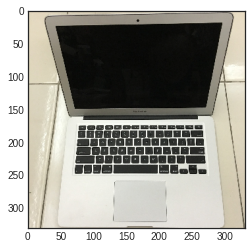

In [134]:
img = image.load_img('notebook.jpg', target_size=(331,331))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = nasnet.predict(x)
print(decode_predictions(preds))

# EfficientNet

- EfficientNetB0인 작은 모델에서 주어진 Task에 최적화된 구조로 수정해나가는 형태
- 복잡한 Task에 맞춰 model의 capacity를 늘리기 위해 Wide Scaling, Deep Scaling 그리고 Resolution Scaling을 사용
- EfficientNet은 Wide, Deep, Resolution을 함께 고려하는 Compound Scaling을 사용

In [135]:
from tensorflow.keras.applications.efficientnet import EfficientNetB1, preprocess_input, decode_predictions

efficientnet = EfficientNetB1(include_top=True, weights='imagenet',
                              input_tensor=None, input_shape=None,
                              pooling=None, classes=1000)
efficientnet.summary()

32148312/32148312 [==============================] - 0s 0us/step
Model: "efficientnetb1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 240, 240, 3)  0           ['input_23[0][0]']               
                                                                                                  
 normalization (Normalization)  (None, 240, 240, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescal

In [136]:
!wget -O plane.jpg https://upload.wikimedia.org/wikipedia/commons/1/12/Plane-in-flight.jpg

--2023-02-28 13:56:58--  https://upload.wikimedia.org/wikipedia/commons/1/12/Plane-in-flight.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 487351 (476K) [image/jpeg]
Saving to: ‘plane.jpg’

plane.jpg           100%[===================>] 475.93K  --.-KB/s    in 0.08s   

2023-02-28 13:56:59 (5.61 MB/s) - ‘plane.jpg’ saved [487351/487351]



1/1 [==============================] - 3s 3s/step
[[('n02690373', 'airliner', 0.7587066), ('n04592741', 'wing', 0.1008333), ('n04552348', 'warplane', 0.08244503), ('n04266014', 'space_shuttle', 0.0063415286), ('n02692877', 'airship', 0.00088756904)]]


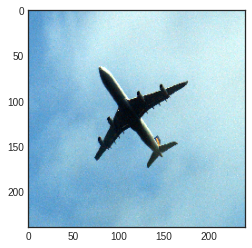

In [138]:
img = image.load_img('plane.jpg', target_size=(240,240))
plt.imshow(img)
x = image.img_to_array(img)
x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
x = preprocess_input(x)

preds = efficientnet.predict(x)
print(decode_predictions(preds))